In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import numpy as np
from tqdm import tqdm
from matplotlib.animation import FuncAnimation, PillowWriter
import matplotlib.pyplot as plt
import os
from IPython.display import HTML

In [6]:
class ResidualConvBlock(nn.Module):
  def __init__(self, in_channels:int, out_channels:int, is_res:bool = False) -> None:
    super().__init__()

    self.same_channels = in_channels == out_channels    #True for residual connection
    self.is_res = is_res                                #Flag for whether to use residual connection

    self.conv1 = nn.Sequential(
          nn.Conv2d(in_channels, out_channels, 3, 1, 1), #3x3 kernel with stride 1 and padding 1
          nn.BatchNorm2d(out_channels),
          nn.GELU(),
    )

    self.conv2 = nn.Sequential(
          nn.Conv2d(out_channels, out_channels, 3, 1, 1), #3x3 kernel with stride 1 and padding 1
          nn.BatchNorm2d(out_channels),
          nn.GELU(),
    )

  def forward(self, x: torch.Tensor) -> torch.Tensor:

    if self.is_res:                                     #If using residual connection
      x1 = self.conv1(x)
      x2 = self.conv2(x1)

      if self.same_channels:
        out = x + x2

      else:                                             #1x1 convolution to match dimensions
        shortcut = nn.Conv2d(x.shape[1], x2.shape[1], kernel_size=1, stride=1, padding=0).to(x.device)
        out = shortcut(x) + x2


      return out / 1.1414                                #Normalization output tensor

    else:
      x1 = self.conv1(x)
      x2 = self.conv2(x1)
      return x2

  def get_out_channels(self):                           #Method to get the number of output channels
    return self.conv2[0].out_channels

  def set_out_channels(self,out_channels):              #Method to set the number of output channels
    self.conv1[0].out_channels, self.conv2[0].in_channels, self.conv2[0].out_channels = out_channels, out_channels, out_channels


In [7]:
class UnetDown(nn.Module):
  def __init__(self, in_channels, out_channels):
    super().__init__()


    #Each layer: 2 residual conv block layers and one MaxPool2d layer for downsampling
    layers = [
      ResidualConvBlock(in_channels, out_channels), 
      ResidualConvBlock(out_channels, out_channels), 
      nn.MaxPool2d(2)]

    self.model = nn.Sequential(*layers)

  def forward(self, x):
    return self.model(x)

In [8]:
class UnetUp(nn.Module):
  def __init__(self, in_channels, out_channels):
    super().__init__()

    layers = [
        nn.ConvTranspose2d(in_channels, out_channels, 2, 2),
        ResidualConvBlock(out_channels, out_channels),
        ResidualConvBlock(out_channels, out_channels)
    ]

    self.model = nn.Sequential(*layers)


  def forward(self, x, skip):
    x = torch.cat((x, skip), 1)
    return self.model(x)


In [9]:
class EmbedFC(nn.Module):
  def __init__(self, input_dim, emb_dim):
    super().__init__()
    '''
    Generic one layer feed-forward network
    '''
    self.input_dim = input_dim
    layers = [
        nn.Linear(input_dim, emb_dim),
        nn.GELU(),
        nn.Linear(emb_dim,emb_dim)

    ]

    self.model = nn.Sequential(*layers)

  def forward(self, x):
    return self.model(x.view(-1, self.input_dim))

In [10]:
class ContextUnet(nn.Module):
  def __init__(self, in_channels, n_feat=256, n_cfeat=10, height= 28):
    super().__init__()

    self.in_channels = in_channels  #no. of input channels
    self.n_feat = n_feat            #no. of intermediate feature maps
    self.n_cfeat = n_cfeat          #no. of context features
    self.h = height                 #(H, W) on input image, H == W and H%4 = 0

    print(f"in_channels: {self.in_channels}, n_feat: {self.n_feat}, n_cfeat: {self.n_cfeat}, height: {self.h}")

    #Initialize the initial conv layer
    self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)
    print(f"Inital conv layer:")
    print(f"Input: (in_channels, n_feat) -> {in_channels, n_feat}")
    print(f"Output: init_conv {self.init_conv}")

    #Initialize the down-sampling path of the U-Net
    self.down1 = UnetDown(n_feat, n_feat)     #[10, 256, 8, 8]
    self.down2 = UnetDown(n_feat, 2*n_feat)   #[10, 256, 4, 4]                                      #Check dimentions
    print(f"Down1 layer:")
    print(f"Input: (n_feat, n_feat) -> {n_feat, n_feat}")
    print(f"Output: down1 {self.down1}")


    print(f"Down2 layer:")
    print(f"Input: (n_feat, 2*n_feat) -> {n_feat, 2*n_feat}")
    print(f"Output: down2 {self.down2}")

    self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())                                         #Try 7 instead of 4

    print(f"to_vec layer:")
    print(f"Output: {self.to_vec}")

    #Embed the timestamp and context labels with a one-layer fully connected neural network
    self.timeembed1 = EmbedFC(1, 2*n_feat)
    self.timeembed2 = EmbedFC(1, 1*n_feat)
    self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
    self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

    print(f"Timestamp embed 1 layer: {self.timeembed1}")
    print(f"Timestamp embed 2 layer: {self.timeembed2}")

    print(f"Context embed 1 layer: {self.contextembed1}")
    print(f"Context embed 2 layer: {self.contextembed2}")

    #Initialize the up-sampling path of the U-Net with three levels
    self.up0 = nn.Sequential(
        nn.ConvTranspose2d(2*n_feat, 2*n_feat, self.h//4, self.h//4),
        nn.GroupNorm(8, 2 * n_feat),
        nn.ReLU(),
    )
    print(f"Up0 layer:")
    print(f"Input: (2*n_feat) -> {2*n_feat}")
    print(f"Output: (2*n_feat) -> {2*n_feat}, kernel_size -> {self.h//4}, stride -> {self.h//4}")
    print(f"Output: up0 {self.up0}")

    self.up1 = UnetUp(4*n_feat, n_feat)
    self.up2 = UnetUp(2*n_feat, n_feat)


    print(f"Up1 layer:")
    print(f"Input: (4*n_feat, n_feat) -> {4*n_feat, n_feat}")
    print(f"Output: up1 {self.up1}")


    print(f"Up2 layer:")
    print(f"Input: (2*n_feat, n_feat) -> {2*n_feat, n_feat}")
    print(f"Output: up2 {self.up2}")

    #Initialize the final convolutional layers to map the same number of channels as the input image
    self.out = nn.Sequential(
        nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), #reduces the number of feature maps
        nn.GroupNorm(8, n_feat),                #Normalize
        nn.ReLU(),
        nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), #map to the same number of channels as input

    )
    print(f"Out layer")
    print(f"Output: out {self.out}")

  def forward(self, x, t, c=None):
    '''
    x : (batch, n_feat, h, w) -> input image
    t : (batch, n_cfeat)      -> timestamp
    c : (batch, n_classes)    -> context label
    '''
    # print("------>")
    # print(x.shape, t.shape)
    x = self.init_conv(x)           #Initial conv layer
    down1 = self.down1(x)           #Down sampling 1 [10, 256, 8, 8]
    down2 = self.down2(down1)       #Down sampling 2 [10, 256, 4, 4]

    hiddenvec = self.to_vec(down2) #feature map to vector and apply an activation

    if c is None:
      c = torch.zeros(x.shape[0], self.n_cfeat)
    c = c.to(x)
    cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1) #Embed context1 (batch, 2*n_feat, 1, 1)
    temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)    #Embed timestamp1
    cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)     #Embed context2
    temb2 = self.timeembed2(t).view(-1,self.n_feat, 1, 1)         #Embed timestamp2


    up1 = self.up0(hiddenvec)
    up2 = self.up1(cemb1*up1 + temb1, down2)                      #Add and multiply embeddings
    up3 = self.up2(cemb2*up2 + temb2, down1)
    out = self.out(torch.cat((up3, x), 1))
    return out


In [11]:
#Hyperparameters

##Diffusion hyperparameters
timesteps = 500
beta1 = 1e-4
beta2 = 0.02

##Network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
n_feat = 64 #hidden dim of features
n_cfeat = 5 #context vector
height = 16 #16x16 image
save_dir = './weight/'

##Training hyperparameters
batch_size = 100
n_epoch = 32
lrate = 1e-3

transform = transforms.Compose([
    transforms.ToTensor(),                # from [0,255] to range [0.0,1.0]
    transforms.Normalize((0.5,), (0.5,))  # range [-1,1]

])


In [12]:
#DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps+1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp() #Log-space cumulative product
ab_t[0] = 1

In [13]:
#Construct model
nn_model = ContextUnet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

in_channels: 3, n_feat: 64, n_cfeat: 5, height: 16
Inital conv layer:
Input: (in_channels, n_feat) -> (3, 64)
Output: init_conv ResidualConvBlock(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU(approximate='none')
  )
  (conv2): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU(approximate='none')
  )
)
Down1 layer:
Input: (n_feat, n_feat) -> (64, 64)
Output: down1 UnetDown(
  (model): Sequential(
    (0): ResidualConvBlock(
      (conv1): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): GELU(approximate='none')
      )
      (conv2): Sequential(
      

### Training

In [14]:
class CustomDataset(Dataset):
    def __init__(self, sfilename, lfilename, transform, null_context=False):
        self.sprites = np.load(sfilename)
        self.slabels = np.load(lfilename)
        self.sprites_shape = self.sprites.shape
        self.slabel_shape = self.slabels.shape
        print(f"sprite shape: {self.sprites_shape}")
        print(f"labels shape: {self.slabel_shape}")
        self.transform = transform
        self.null_context = null_context
   
    def __len__(self):
        return len(self.sprites)
    
    def __getitem__(self, idx):
        if self.transform:
            image = self.transform(self.sprites[idx])
            if self.null_context:
                label = torch.tensor(0).to(torch.int64)
            else:
                label = torch.tensor(self.slabels[idx]).to(torch.int64)
        return (image, label)

    def getshapes(self):
        return self.sprites_shape, self.slabel_shape

In [15]:
#load dataset and construct optimizer
dataset = CustomDataset("./data/sprites_1788_16x16.npy", "./data/sprite_labels_nc_1788_16x16.npy", transform, null_context=False)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)

sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)


In [16]:
def perturb_input(x, t, noise):
    return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]) * noise


In [34]:
#train without context code

epoch_loss_history = []
nn_model.train()
for ep in range(n_epoch):
    print(f'epoch {ep}')
    #Linearly decay learning rate
    optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)

    pbar = tqdm(dataloader, mininterval=2)
    batch_losses = []
    for x, _ in pbar:                               #x: images 
        optim.zero_grad()
        x = x.to(device)

        noise = torch.randn_like(x)
        t = torch.randint(1, timesteps+1, (x.shape[0], )).to(device)
        x_pert = perturb_input(x, t, noise)

        pred_noise = nn_model(x_pert, t/timesteps)
        
        loss = F.mse_loss(pred_noise, noise)
        loss.backward()
        optim.step()

        batch_losses.append(loss.item())

    avg_batch_loss = sum(batch_losses) / len(batch_losses)
    print(f"------------------ Loss: {avg_batch_loss}")
    epoch_loss_history.append(avg_batch_loss)
    if ep % 4 == 0 or ep == int(n_epoch - 1):
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        torch.save(nn_model.state_dict(), save_dir + f"model_{ep}.pth")
        print("saved model at " + save_dir + f"model_{ep}.pth")
            

epoch 0


100%|██████████| 894/894 [00:19<00:00, 46.24it/s]


------------------ Loss: 0.2901606780437282
saved model at ./weight/model_0.pth
epoch 1


100%|██████████| 894/894 [00:18<00:00, 47.24it/s]


------------------ Loss: 0.2084719066318516
epoch 2


100%|██████████| 894/894 [00:18<00:00, 47.29it/s]


------------------ Loss: 0.18808027591047938
epoch 3


100%|██████████| 894/894 [00:18<00:00, 47.18it/s]


------------------ Loss: 0.1727257035922684
epoch 4


100%|██████████| 894/894 [00:18<00:00, 47.14it/s]


------------------ Loss: 0.16530667034538266
saved model at ./weight/model_4.pth
epoch 5


100%|██████████| 894/894 [00:18<00:00, 47.16it/s]


------------------ Loss: 0.157684175251781
epoch 6


100%|██████████| 894/894 [00:18<00:00, 47.14it/s]


------------------ Loss: 0.151077911174404
epoch 7


100%|██████████| 894/894 [00:18<00:00, 47.16it/s]


------------------ Loss: 0.14836848064657027
epoch 8


100%|██████████| 894/894 [00:18<00:00, 47.10it/s]


------------------ Loss: 0.14380167320504017
saved model at ./weight/model_8.pth
epoch 9


100%|██████████| 894/894 [00:18<00:00, 47.16it/s]


------------------ Loss: 0.13954759490836655
epoch 10


100%|██████████| 894/894 [00:18<00:00, 47.15it/s]


------------------ Loss: 0.13584227785801462
epoch 11


100%|██████████| 894/894 [00:18<00:00, 47.16it/s]


------------------ Loss: 0.13316318089396628
epoch 12


100%|██████████| 894/894 [00:18<00:00, 47.15it/s]


------------------ Loss: 0.13037349125349548
saved model at ./weight/model_12.pth
epoch 13


100%|██████████| 894/894 [00:18<00:00, 47.12it/s]


------------------ Loss: 0.12909606323312858
epoch 14


100%|██████████| 894/894 [00:18<00:00, 47.15it/s]


------------------ Loss: 0.12748681623863695
epoch 15


100%|██████████| 894/894 [00:18<00:00, 47.16it/s]


------------------ Loss: 0.12460381596847135
epoch 16


100%|██████████| 894/894 [00:18<00:00, 47.19it/s]


------------------ Loss: 0.12323162897221195
saved model at ./weight/model_16.pth
epoch 17


100%|██████████| 894/894 [00:18<00:00, 47.17it/s]


------------------ Loss: 0.12132925445201413
epoch 18


100%|██████████| 894/894 [00:18<00:00, 47.19it/s]


------------------ Loss: 0.11942940322844774
epoch 19


100%|██████████| 894/894 [00:18<00:00, 47.15it/s]


------------------ Loss: 0.1192740200616636
epoch 20


100%|██████████| 894/894 [00:18<00:00, 47.18it/s]


------------------ Loss: 0.116384888330362
saved model at ./weight/model_20.pth
epoch 21


100%|██████████| 894/894 [00:18<00:00, 47.13it/s]


------------------ Loss: 0.11507057606907233
epoch 22


100%|██████████| 894/894 [00:18<00:00, 47.14it/s]


------------------ Loss: 0.11460675685031035
epoch 23


100%|██████████| 894/894 [00:18<00:00, 47.14it/s]


------------------ Loss: 0.11273576588822025
epoch 24


100%|██████████| 894/894 [00:18<00:00, 47.16it/s]


------------------ Loss: 0.1129360652426612
saved model at ./weight/model_24.pth
epoch 25


100%|██████████| 894/894 [00:18<00:00, 47.19it/s]


------------------ Loss: 0.11182034488192341
epoch 26


100%|██████████| 894/894 [00:18<00:00, 47.16it/s]


------------------ Loss: 0.11025450949117507
epoch 27


100%|██████████| 894/894 [00:18<00:00, 47.15it/s]


------------------ Loss: 0.10909277563643802
epoch 28


100%|██████████| 894/894 [00:18<00:00, 47.14it/s]


------------------ Loss: 0.10863448981970748
saved model at ./weight/model_28.pth
epoch 29


100%|██████████| 894/894 [00:18<00:00, 47.16it/s]


------------------ Loss: 0.10769532500897477
epoch 30


100%|██████████| 894/894 [00:18<00:00, 47.18it/s]


------------------ Loss: 0.10748783806526421
epoch 31


100%|██████████| 894/894 [00:18<00:00, 47.16it/s]

------------------ Loss: 0.10702125066412109
saved model at ./weight/model_31.pth


In [13]:
#train context code

epoch_loss_history = []
nn_model.train()
for ep in range(n_epoch):
    print(f'epoch {ep}')
    #Linearly decay learning rate
    optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)

    pbar = tqdm(dataloader, mininterval=2)
    batch_losses = []
    for x, c in pbar:                               #x: images, c: context
        optim.zero_grad()
        x = x.to(device)
        c = c.to(device)

        noise = torch.randn_like(x)
        t = torch.randint(1, timesteps+1, (x.shape[0], )).to(device)
        x_pert = perturb_input(x, t, noise)

        pred_noise = nn_model(x_pert, t/timesteps, c)
        
        loss = F.mse_loss(pred_noise, noise)
        loss.backward()
        optim.step()

        batch_losses.append(loss.item())

    avg_batch_loss = sum(batch_losses) / len(batch_losses)
    print(f"------------------ Loss: {avg_batch_loss}")
    epoch_loss_history.append(avg_batch_loss)
    if ep % 4 == 0 or ep == int(n_epoch - 1):
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        torch.save(nn_model.state_dict(), save_dir + f"model_context_{ep}.pth")
        print("saved model at " + save_dir + f"model_{ep}.pth")
            

epoch 0


100%|██████████| 894/894 [00:19<00:00, 46.82it/s]


------------------ Loss: 0.30663620630566707
saved model at ./weight/model_0.pth
epoch 1


100%|██████████| 894/894 [00:18<00:00, 47.40it/s]


------------------ Loss: 0.21547578856915703
epoch 2


100%|██████████| 894/894 [00:18<00:00, 47.32it/s]


------------------ Loss: 0.1907099671078475
epoch 3


100%|██████████| 894/894 [00:18<00:00, 47.30it/s]


------------------ Loss: 0.176716964391854
epoch 4


100%|██████████| 894/894 [00:18<00:00, 47.34it/s]


------------------ Loss: 0.1669938913161056
saved model at ./weight/model_4.pth
epoch 5


100%|██████████| 894/894 [00:18<00:00, 47.33it/s]


------------------ Loss: 0.16000607818098408
epoch 6


100%|██████████| 894/894 [00:18<00:00, 47.31it/s]


------------------ Loss: 0.1534625884787215
epoch 7


100%|██████████| 894/894 [00:18<00:00, 47.29it/s]


------------------ Loss: 0.1479320789726922
epoch 8


100%|██████████| 894/894 [00:18<00:00, 47.30it/s]


------------------ Loss: 0.14269479329987395
saved model at ./weight/model_8.pth
epoch 9


100%|██████████| 894/894 [00:18<00:00, 47.32it/s]


------------------ Loss: 0.1395795192711172
epoch 10


100%|██████████| 894/894 [00:18<00:00, 47.34it/s]


------------------ Loss: 0.13610540232069007
epoch 11


100%|██████████| 894/894 [00:18<00:00, 47.36it/s]


------------------ Loss: 0.1329060799006781
epoch 12


100%|██████████| 894/894 [00:18<00:00, 47.34it/s]


------------------ Loss: 0.12944310906882786
saved model at ./weight/model_12.pth
epoch 13


100%|██████████| 894/894 [00:18<00:00, 47.34it/s]


------------------ Loss: 0.1264573694008842
epoch 14


100%|██████████| 894/894 [00:18<00:00, 47.36it/s]


------------------ Loss: 0.12481023822921501
epoch 15


100%|██████████| 894/894 [00:18<00:00, 47.33it/s]


------------------ Loss: 0.12192789984396107
epoch 16


100%|██████████| 894/894 [00:18<00:00, 47.35it/s]


------------------ Loss: 0.12015930517374536
saved model at ./weight/model_16.pth
epoch 17


100%|██████████| 894/894 [00:18<00:00, 47.31it/s]


------------------ Loss: 0.11922992043347166
epoch 18


100%|██████████| 894/894 [00:18<00:00, 47.33it/s]


------------------ Loss: 0.11770601785622987
epoch 19


100%|██████████| 894/894 [00:18<00:00, 47.33it/s]


------------------ Loss: 0.11602829583405914
epoch 20


100%|██████████| 894/894 [00:18<00:00, 47.31it/s]


------------------ Loss: 0.11417018164624304
saved model at ./weight/model_20.pth
epoch 21


100%|██████████| 894/894 [00:18<00:00, 47.33it/s]


------------------ Loss: 0.11348220933503753
epoch 22


100%|██████████| 894/894 [00:18<00:00, 47.31it/s]


------------------ Loss: 0.11229109602419855
epoch 23


100%|██████████| 894/894 [00:18<00:00, 47.31it/s]


------------------ Loss: 0.11053599803906426
epoch 24


100%|██████████| 894/894 [00:18<00:00, 47.35it/s]


------------------ Loss: 0.10816164762281731
saved model at ./weight/model_24.pth
epoch 25


100%|██████████| 894/894 [00:18<00:00, 47.32it/s]


------------------ Loss: 0.10796683853371299
epoch 26


100%|██████████| 894/894 [00:18<00:00, 47.32it/s]


------------------ Loss: 0.10728162085799962
epoch 27


100%|██████████| 894/894 [00:18<00:00, 47.32it/s]


------------------ Loss: 0.10620426099072366
epoch 28


100%|██████████| 894/894 [00:18<00:00, 47.36it/s]


------------------ Loss: 0.10547102676075311
saved model at ./weight/model_28.pth
epoch 29


100%|██████████| 894/894 [00:18<00:00, 47.33it/s]


------------------ Loss: 0.1051054111654793
epoch 30


100%|██████████| 894/894 [00:18<00:00, 47.33it/s]


------------------ Loss: 0.10315422438735129
epoch 31


100%|██████████| 894/894 [00:18<00:00, 47.31it/s]

------------------ Loss: 0.1024326922192803
saved model at ./weight/model_31.pth


### Sampling

In [17]:
def denoise_add_noise(x, t, pred_noise, z=None):
    """
    Removes the predicted noise but adds some noise back in to avoid collapse
    """
    if z is None:
        z = torch.randn_like(x)
    noise = b_t.sqrt()[t] * z
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()

    return mean + noise

In [18]:
# sample using the standard algorithm

@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20):
    """
    Samples noise: x_T ~ N(0, 1), sample intial noise
    """

    samples = torch.randn(n_sample, 3, height, height).to(device)

    intermediate = [] #Array to keep track of generated steps for plotting


    for i in range(timesteps, 0, -1):
        print(f"Sampling timestamp {i:3d}", end='\r')

        t = torch.tensor([i / timesteps])[:, None, None, None].to(device) #Reshape time tensor
        z = torch.randn_like(samples) if i > 1 else 0

        eps = nn_model(samples, t) #Predict noise e_(x_t, t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate == 0 or i == timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate
    


In [19]:
def plot_sample(x_gen_store,n_sample,nrows,save_dir, fn,  w, save=False):
    ncols = n_sample//nrows
    sx_gen_store = np.moveaxis(x_gen_store,2,4)                               # change to Numpy image format (h,w,channels) vs (channels,h,w)
    nsx_gen_store = norm_all(sx_gen_store, sx_gen_store.shape[0], n_sample)   # unity norm to put in range [0,1] for np.imshow
    
    # create gif of images evolving over time, based on x_gen_store
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True,figsize=(ncols,nrows))
    def animate_diff(i, store):
        print(f'gif animating frame {i} of {store.shape[0]}', end='\r')
        plots = []
        for row in range(nrows):
            for col in range(ncols):
                axs[row, col].clear()
                axs[row, col].set_xticks([])
                axs[row, col].set_yticks([])
                plots.append(axs[row, col].imshow(store[i,(row*ncols)+col]))
        return plots
    ani = FuncAnimation(fig, animate_diff, fargs=[nsx_gen_store],  interval=200, blit=False, repeat=True, frames=nsx_gen_store.shape[0]) 
    plt.close()
    if save:
        ani.save(save_dir + f"{fn}_w{w}.gif", dpi=100, writer=PillowWriter(fps=5))
        print('saved gif at ' + save_dir + f"{fn}_w{w}.gif")
    return ani


def norm_all(store, n_t, n_s):
    # runs unity norm on all timesteps of all samples
    nstore = np.zeros_like(store)
    for t in range(n_t):
        for s in range(n_s):
            nstore[t,s] = unorm(store[t,s])
    return nstore



def unorm(x):
    # unity norm. results in range of [0,1]
    # assume x (h,w,3)
    xmax = x.max((0,1))
    xmin = x.min((0,1))
    return(x - xmin)/(xmax - xmin)


In [35]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/model_31.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [27]:
plt.clf()
samples, intermediate_ddpm = sample_ddpm(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

In [28]:
# incorrectly sample without adding noise

@torch.no_grad()
def sample_ddpm_incorrect(n_sample, save_rate=20):
    """
    Samples noise: x_T ~ N(0, 1), sample intial noise
    """

    samples = torch.randn(n_sample, 3, height, height).to(device)

    intermediate = [] #Array to keep track of generated steps for plotting


    for i in range(timesteps, 0, -1):
        print(f"Sampling timestamp {i:3d}", end='\r')

        t = torch.tensor([i / timesteps])[:, None, None, None].to(device) #Reshape time tensor
        z = 0

        eps = nn_model(samples, t) #Predict noise e_(x_t, t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate == 0 or i == timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [29]:
plt.clf()
samples, intermediate_ddpm = sample_ddpm_incorrect(32)
animation_ddpm = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

In [19]:
# sample with context using the standard algorithm

@torch.no_grad()
def sample_ddpm_context(n_sample, context, save_rate=20):
    """
    Samples noise: x_T ~ N(0, 1), sample intial noise
    """

    samples = torch.randn(n_sample, 3, height, height).to(device)

    intermediate = [] #Array to keep track of generated steps for plotting


    for i in range(timesteps, 0, -1):
        print(f"Sampling timestamp {i:3d}", end='\r')

        t = torch.tensor([i / timesteps])[:, None, None, None].to(device) #Reshape time tensor
        z = torch.randn_like(samples) if i > 1 else 0

        eps = nn_model(samples, t, context) #Predict noise e_(x_t, t, ctx)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate == 0 or i == timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate
    


In [24]:
# visualize samples with randomly selected context
plt.clf()
ctx = F.one_hot(torch.randint(0, 5, (32,)), 5).to(device=device)
samples, intermediate = sample_ddpm_context(32, ctx)
animation_ddpm_context = plot_sample(intermediate,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm_context.to_jshtml())

<Figure size 640x480 with 0 Axes>

In [25]:
def show_images(imgs, nrow=2):
    _, axs = plt.subplots(nrow, imgs.shape[0] // nrow, figsize=(4,2 ))
    axs = axs.flatten()
    for img, ax in zip(imgs, axs):
        img = (img.permute(1, 2, 0).clip(-1, 1).detach().cpu().numpy() + 1) / 2
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(img)
    plt.show()

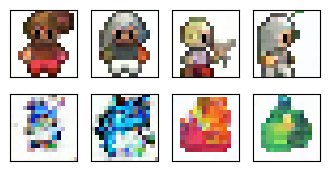

In [27]:
# user defined context
ctx = torch.tensor([
    # hero, non-hero, food, spell, side-facing
    [1,0,0,0,0],  
    [1,0,0,0,0],    
    [0,0,0,0,1],
    [0,0,0,0,1],    
    [0,1,0,0,0],
    [0,1,0,0,0],
    [0,0,1,0,0],
    [0,0,1,0,0],
]).float().to(device)
samples, _ = sample_ddpm_context(ctx.shape[0], ctx)
show_images(samples)

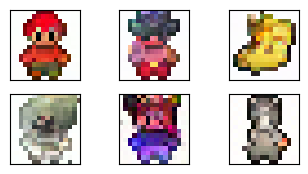

In [33]:
# mix of defined context
ctx = torch.tensor([
    # hero, non-hero, food, spell, side-facing
    [1,0,0,0,0],      #human
    [1,0,0.6,0,0],    
    [0,0,0.6,0.4,0],  
    [1,0,0,0,1],  
    [1,1,0,0,0],
    [1,0,0,1,0]
]).float().to(device)
samples, _ = sample_ddpm_context(ctx.shape[0], ctx)
show_images(samples)

### Fast Sampling

$$
[ x_{t-1} = \sqrt{\bar{\alpha}{t-1}} \cdot \left( \frac{x_t - \sqrt{1 - \bar{\alpha}t} \cdot \epsilon\theta(x_t, t)}{\sqrt{\bar{\alpha}t}} \right) + \sqrt{1 - \bar{\alpha}{t-1}} \cdot \epsilon\theta(x_t, t) ]
$$


In [21]:
#Define sampling function for DDIM
def denoise_ddim(x, t, t_prev, pred_noise):
    ab = ab_t[t]
    ab_prev = ab_t[t_prev]

    x0_pred = ab_prev.sqrt() / ab.sqrt() * (x - (1 - ab).sqrt() * pred_noise)
    dir_xt = (1 - ab_prev).sqrt() * pred_noise

    return x0_pred + dir_xt

In [30]:
#Sample quickly using DDIM
@torch.no_grad()
def sample_ddim(n_sample, n=20):
    samples = torch.randn(n_sample, 3, height, height).to(device)

    intermediate = []

    step_size = timesteps // n 

    for i in range(timesteps, 0, -step_size):
        print(f"sampling timestep {i:3d}", end = "\r")

        #Reshape time torch
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        eps = nn_model(samples, t) #predict noise e_(x_t, t)
        samples = denoise_ddim(samples, i, i - step_size, eps)
        intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [29]:
# visualize samples
plt.clf()
samples, intermediate = sample_ddim(32, n=20)
animation_ddim = plot_sample(intermediate,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddim.to_jshtml())

<Figure size 640x480 with 0 Axes>

In [33]:
#Sample quickly with context using DDIM
@torch.no_grad()
def sample_ddim_context(n_sample, context, n=20):
    samples = torch.randn(n_sample, 3, height, height).to(device)

    intermediate = []

    step_size = timesteps // n 

    for i in range(timesteps, 0, -step_size):
        print(f"sampling timestep {i:3d}", end = "\r")

        #Reshape time torch
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        eps = nn_model(samples, t, context) #Predict noise e_(x_t, t, ctx)
        samples = denoise_ddim(samples, i, i - step_size, eps)
        intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [34]:

# visualize samples
plt.clf()
ctx = F.one_hot(torch.randint(0, 5, (32,)), 5).to(device=device).float()
samples, intermediate = sample_ddim_context(32, ctx)
animation_ddpm_context = plot_sample(intermediate,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm_context.to_jshtml())

<Figure size 640x480 with 0 Axes>

In [37]:
%timeit -r 1 sample_ddim(32, n=25)
%timeit -r 1 sample_ddpm(32)

67.6 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)
1.33 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)
